# Principal Component Analysis (PCA)

This notebook will perform PCA to further understand the weather narrative files. Code is largely based on ETA methods discussed in class.

In [1]:
# data wrangling -- typical packages
import pandas as pd
import numpy as np
import re


# data viz
import plotly.graph_objects as go
import plotly.express as px
import plotly.offline as pyo 
import seaborn as sns
from matplotlib import pyplot as plt
pyo.init_notebook_mode() ## ensures that the plotly graphics convert to HTML
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt


# tokenizing
from glob import glob
import nltk

# distance computing
from numpy.linalg import norm
from scipy.spatial.distance import pdist, squareform

# pca stuff
from scipy.linalg import norm, eigh
from sklearn.decomposition import PCA

In [4]:
# setting OHCO
OHCO = ["EVENT_Label","EVENT_ID", "para_num", "sent_num", "token_num"] # event ID is the chapter number 

# setting the bags
SENTS = OHCO[:4]
PARAS = OHCO[:3]
EVENT_ID = OHCO[:2]
EVENT_TYPE = OHCO[:1]

In [5]:
# reading the data
path = "/Users/prabh/Desktop/Portfolio/mynewbook/data/"

LIB = pd.read_csv(path+"LIB2020.csv")
LIB_Types = pd.read_csv(path+"LIB_TYPES2020.csv", index_col=[0])
TOKEN = pd.read_csv(path+"TOKEN2020.csv").set_index(OHCO)
VOCAB = pd.read_csv(path+"VOCAB2020.csv").set_index("term_str")

#### Create Two Seperate LIBs to Diagnose Prinicpal Components

In [93]:
state_types = LIB[["EVENT_ID", "STATE"]].set_index("EVENT_ID")["STATE"].to_dict()

In [55]:
event_types = LIB_Types.set_index('EVENT_Label')['EVENT_TYPE'].to_dict()

In [89]:
event_types

{1: 'Dense Fog',
 2: 'High Wind',
 3: 'Flood',
 4: 'Winter Storm',
 5: 'Heavy Snow',
 6: 'Winter Weather',
 7: 'Thunderstorm Wind',
 8: 'Strong Wind',
 9: 'Blizzard',
 10: 'Marine Thunderstorm Wind',
 11: 'Heavy Rain',
 12: 'Lakeshore Flood',
 13: 'Tornado',
 14: 'Ice Storm',
 15: 'High Surf',
 16: 'Flash Flood',
 17: 'Lightning',
 18: 'Extreme Cold/Wind Chill',
 19: 'Hail',
 20: 'Avalanche',
 21: 'Drought',
 22: 'Frost/Freeze',
 23: 'Debris Flow',
 24: 'Rip Current',
 25: 'Lake-Effect Snow',
 26: 'Marine High Wind',
 27: 'Sleet',
 28: 'Cold/Wind Chill',
 29: 'Coastal Flood',
 30: 'Dust Storm',
 31: 'Waterspout',
 32: 'Astronomical Low Tide',
 33: 'Wildfire',
 34: 'Funnel Cloud',
 35: 'Freezing Fog',
 36: 'Dust Devil',
 37: 'Marine Hail',
 38: 'Heat',
 39: 'Excessive Heat',
 40: 'Marine Strong Wind',
 41: 'Marine Dense Fog',
 42: 'Tropical Depression',
 43: 'Tropical Storm',
 44: 'Marine Tropical Storm',
 45: 'Storm Surge/Tide',
 46: 'Hurricane',
 47: 'Marine Hurricane/Typhoon',
 48: '

In [56]:
# # checking LIB
# LIB_Type = LIB_Type[["EVENT_label", "EVENT_TYPE"]]
# LIB_Type
LIB_Types

,EVENT_Label,EVENT_TYPE
0,1,Dense Fog
1,2,High Wind
2,3,Flood
3,4,Winter Storm
4,5,Heavy Snow
5,6,Winter Weather
6,7,Thunderstorm Wind
7,8,Strong Wind
8,9,Blizzard
9,10,Marine Thunderstorm Wind


In [57]:
# checking TOKEN
TOKEN.head()

pos_tuple  pos  \
EVENT_Label EVENT_ID para_num sent_num token_num                               
1           863438   0        0        0          ('Visibility', 'NNP')  NNP   
                                       1                ('below', 'IN')   IN   
                                       2                    ('a', 'DT')   DT   
                                       3              ('quarter', 'NN')   NN   
                                       4                 ('mile', 'NN')   NN   

                                                   token_str    term_str  
EVENT_Label EVENT_ID para_num sent_num token_num                          
1           863438   0        0        0          Visibility  visibility  
                                       1               below       below  
                                       2                   a           a  
                                       3             quarter     quarter  
                                       4                mile        mile

In [58]:
# checking VOCAB
VOCAB.head()

,term_id,n,num,stop,p_stem,pos_max
term_str,,,,,,
NaN,0,355,0,0,NaN,:
0,1,17,1,0,0,CD
000,2,1,1,0,000,CD
0000,3,11,1,0,0000,CD
0000cst,4,4,1,0,0000cst,CD


## Vector Space Models <a class="anchor" id="vsm"></a>

In [59]:
# removing NAs
VOCAB = VOCAB[~VOCAB.index.isna()]
VOCAB

,term_id,n,num,stop,p_stem,pos_max
term_str,,,,,,
0,1,17,1,0,0,CD
000,2,1,1,0,000,CD
0000,3,11,1,0,0000,CD
0000cst,4,4,1,0,0000cst,CD
0001,5,6,1,0,0001,CD
...,...,...,...,...,...,...
zoologico,28971,1,0,0,zoologico,NNP
zortman,28972,11,0,0,zortman,NNP
zucksville,28973,1,0,0,zucksvil,NNP


In [60]:
# TFIDF Function
def get_vocab(tokens, vocab, bag, tf_type='n', item_type='term_str', alpha=.4, new_col_suffix=''):
    
    # Create BOW
    BOW = tokens.groupby(bag+[item_type])[item_type].count()\
        .to_frame('n')
    BOW['c'] = 1
    
    # Compute TF
    D = BOW.groupby(bag).n
    if tf_type == 'n':
        BOW['tf'] = BOW.n
    elif tf_type == 'sum':
        BOW['tf'] = D.apply(lambda x: x / x.sum()) # cp = P(w|d)
    elif tf_type == 'l2':
        BOW['tf'] = D.apply(lambda x: x / np.sqrt((x**2).sum()))
    elif tf_type == 'max':
        BOW['tf'] = D.apply(lambda x: alpha + (1-alpha) * (x / x.max()))
    elif tf_type == 'log':
        BOW['tf'] = D.apply(lambda x: np.log2(1 + x))
    elif tf_type == 'sub':
        BOW['tf'] = D.apply(lambda x: 1 + np.log2(x))
    elif tf_type == 'bool':
        BOW['tf'] = BOW.c
    elif tf_type == 'bool2':
        BOW['tf'] = D.apply(lambda x: 1 / len(x))
    
    # Normalize TF
    
    # Compute IDF
    vocab['df'] = BOW.groupby('term_str').n.count()
    N_docs = len(D.groups)
    vocab['idf'] = np.log2(N_docs/vocab.df)
    
    # Compute TFIDF
    BOW['tfidf'] = BOW.tf * vocab.idf
    
    # Compute aggregate TFIDF
    col = 'tfidf_sum' + new_col_suffix
    vocab[col] = BOW.groupby(item_type)['tfidf'].sum()
    
#     vocab[col] = (vocab[col] - vocab[col].mean()) / vocab[col].std()
#     vocab[col] = vocab[col] - vocab[col].min()
    
    return vocab, BOW

In [61]:
def get_tfidf(TOKEN, bag, count_method='n', tf_method='sum', item_type='term_str'):
    
    # Create bag of items (terms or stems)
    BOW = TOKEN.groupby(bag+[item_type])[item_type].count()\
        .to_frame().rename(columns={item_type:'n'})

    # Add binary count column
    BOW['c'] = BOW.n.astype('bool').astype('int')
    
    # Create documnet-term count matrix
    DTCM = BOW[count_method].unstack().fillna(0).astype('int')

    # Compute TF
    if tf_method == 'sum':
        TF = DTCM.T / DTCM.T.sum()
    elif tf_method == 'max':
        TF = .4 + .6 * (DTCM.T / DTCM.T.max()) # See Manning, et al. for choice of α
    elif tf_method == 'log':
        TF = np.log10(DTCM.T + 1)
    elif tf_method == 'raw':
        TF = DTCM.T
    elif tf_method == 'binary':
        TF = DTCM.T.astype('bool').astype('int')
    
    # Compute IDF
    N = DTCM.shape[0]
    DF = DTCM[DTCM > 0].count()
    IDF = np.log10(N / DF)
    
    TFIDF = TF.T * IDF
    
    return TFIDF

In [81]:
def get_pca(X, n_comps=10):
    
    global VSHORT

    COV = X.cov()

    eig_vals, eig_vecs = eigh(COV)
    EIG_VEC = pd.DataFrame(eig_vecs, index=VSHORT.index, columns=VSHORT.index)
    EIG_VAL = pd.DataFrame(eig_vals, index=VSHORT.index, columns=['eig_val'])
    EIG_VAL.index.name = 'term_id'
    EIG_PAIRS = EIG_VAL.join(EIG_VEC.T)
    EIG_PAIRS['exp_var'] = np.round((EIG_PAIRS.eig_val / EIG_PAIRS.eig_val.sum()) * 100, 2)

    COMPS = EIG_PAIRS.sort_values('exp_var', ascending=False).head(n_comps).reset_index(drop=True)
    COMPS.index.name = 'comp_id'
    COMPS.index = ["PC{}".format(i) for i in COMPS.index.tolist()]

    LOADINGS = COMPS[VSHORT.index].T
    LOADINGS.index.name = 'term_str'

    DCM = TFIDF_SHORT.dot(COMPS[VSHORT.index].T)
#     DCM = DCM.join(LIB[['author','genre']], on='book')
#     DCM['title'] = DCM.apply(lambda x: x.name[0] + ', ch '+ str(x.name[1]), 1)
    
    return EIG_PAIRS, COMPS, LOADINGS, DCM
    

In [15]:
def vis_pcs(M, a, b, label="EVENT_TYPE", prefix='PC', symbol=None):
    fig = px.scatter(M, prefix + str(a), prefix + str(b), 
                        color=label,
                        hover_name='EVENT_TYPE',
#                         hover_data=['genre', 'title'],
#                         marginal_x='box',
                        symbol=symbol,
                        height=1000)
    fig.show()

In [ ]:
max_terms = 4000
tf_method = 'max' # sum, max, raw, bool, bool_raw
global_term_sig = 'tfidf_sum' # tfidf_sum, dfidf
n_comps = 10

#### EVENT ID Bag

In [62]:
# tf-idf with event id bag
VOCAB2, BOW = get_vocab(TOKEN, VOCAB, bag=EVENT_ID, tf_type='max', new_col_suffix='_event_max', alpha=0)

In [72]:
VOCAB2

,term_id,n,num,stop,p_stem,pos_max,df,idf,tfidf_sum_event_max
term_str,,,,,,,,,
0,1,17,1,0,0,CD,17,11.412819,68.476913
000,2,1,1,0,000,CD,1,15.500282,1.409117
0000,3,11,1,0,0000,CD,11,12.040850,88.012880
0000cst,4,4,1,0,0000cst,CD,4,13.500282,15.187817
0001,5,6,1,0,0001,CD,6,12.915319,30.135745
...,...,...,...,...,...,...,...,...,...
zoologico,28971,1,0,0,zoologico,NNP,1,15.500282,15.500282
zortman,28972,11,0,0,zortman,NNP,11,12.040850,81.198553
zucksville,28973,1,0,0,zucksvil,NNP,1,15.500282,15.500282


#### Saving Files 

In [68]:
VOCAB.to_csv("2020vocab_tfidf.csv")

In [69]:
BOW.to_csv("2020_BOW.csv")

In [66]:
TFIDF = BOW.tfidf.unstack(fill_value=0)

In [71]:
TFIDF

term_str                0  000  0000  0000cst  0001  0002  0006  001  0010  \
EVENT_Label EVENT_ID                                                         
1           863438    0.0  0.0   0.0      0.0   0.0   0.0   0.0  0.0   0.0   
            863439    0.0  0.0   0.0      0.0   0.0   0.0   0.0  0.0   0.0   
            863440    0.0  0.0   0.0      0.0   0.0   0.0   0.0  0.0   0.0   
            863441    0.0  0.0   0.0      0.0   0.0   0.0   0.0  0.0   0.0   
            863450    0.0  0.0   0.0      0.0   0.0   0.0   0.0  0.0   0.0   
...                   ...  ...   ...      ...   ...   ...   ...  ...   ...   
49          924958    0.0  0.0   0.0      0.0   0.0   0.0   0.0  0.0   0.0   
50          919803    0.0  0.0   0.0      0.0   0.0   0.0   0.0  0.0   0.0   
            920755    0.0  0.0   0.0      0.0   0.0   0.0   0.0  0.0   0.0   
            922117    0.0  0.0   0.0      0.0   0.0   0.0   0.0  0.0   0.0   
            922118    0.0  0.0   0.0      0.0   0.0   0.0   0.0  0.0   0.0   

term_str              001010  ...  zoie  zollinger  zone  zones  zoo  \
EVENT_Label EVENT_ID          ...                                      
1           863438       0.0  ...   0.0        0.0   0.0    0.0  0.0   
            863439       0.0  ...   0.0        0.0   0.0    0.0  0.0   
            863440       0.0  ...   0.0        0.0   0.0    0.0  0.0   
            863441       0.0  ...   0.0        0.0   0.0    0.0  0.0   
            863450       0.0  ...   0.0        0.0   0.0    0.0  0.0   
...                      ...  ...   ...        ...   ...    ...  ...   
49          924958       0.0  ...   0.0        0.0   0.0    0.0  0.0   
50          919803       0.0  ...   0.0        0.0   0.0    0.0  0.0   
            920755       0.0  ...   0.0        0.0   0.0    0.0  0.0   
            922117       0.0  ...   0.0        0.0   0.0    0.0  0.0   
            922118       0.0  ...   0.0        0.0   0.0    0.0  0.0   

term_str              zoologico  zortman  zucksville  zumbrunn  zuni  
EVENT_Label EVENT_ID                                                  
1           863438          0.0      0.0         0.0       0.0   0.0  
            863439          0.0      0.0         0.0       0.0   0.0  
            863440          0.0      0.0         0.0       0.0   0.0  
            863441          0.0      0.0         0.0       0.0   0.0  
            863450          0.0      0.0         0.0       0.0   0.0  
...                         ...      ...         ...       ...   ...  
49          924958          0.0      0.0         0.0       0.0   0.0  
50          919803          0.0      0.0         0.0       0.0   0.0  
            920755          0.0      0.0         0.0       0.0   0.0  
            922117          0.0      0.0         0.0       0.0   0.0  
            922118          0.0      0.0         0.0       0.0   0.0  

[46350 rows x 28975 columns]

In [74]:
VSHORT = VOCAB.sort_values("tfidf_sum_event_max", ascending=False).head(max_terms)

In [75]:
TFIDF_SHORT = TFIDF[VSHORT.index]

In [82]:
EIG_PAIRS, COMPS, LOADINGS, DCM = get_pca(TFIDF_SHORT)

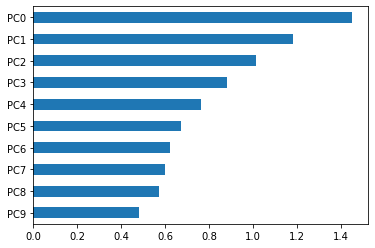

In [84]:
# visualzing the components
COMPS.exp_var.sort_values().plot.barh();

In [85]:
DCM = DCM.reset_index()
DCM["EVENT_TYPE"] = DCM.EVENT_Label.map(event_types)

In [87]:
# checking the DCM table
DCM

,EVENT_Label,EVENT_ID,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,EVENT_TYPE
0,1,863438,-0.097507,-1.612673,0.979496,-0.396077,-0.064989,-0.079892,-0.049508,-0.097036,-0.079670,-0.072918,Dense Fog
1,1,863439,0.170473,-0.614277,-0.031911,0.098178,-0.445449,-0.199647,-0.001389,-0.263082,-0.241475,-0.012642,Dense Fog
2,1,863440,-0.096439,-1.609360,0.974462,-0.392756,-0.065251,-0.082850,-0.047805,-0.099461,-0.081062,-0.070115,Dense Fog
3,1,863441,0.270920,-0.975679,0.157993,-0.237277,-0.697348,-0.078174,-0.046294,-0.218459,-0.483641,0.043804,Dense Fog
4,1,863450,0.128880,-0.928709,0.312683,-0.043604,-0.053874,-0.232403,0.109937,-0.296813,-0.048831,0.076559,Dense Fog
...,...,...,...,...,...,...,...,...,...,...,...,...,...
46345,49,924958,-2.531190,1.487574,0.061748,0.346133,-0.328712,-0.343993,0.136372,-0.416950,0.532895,-0.282943,Marine Tropical Depression
46346,50,919803,-0.191457,-0.120002,-0.683185,0.621446,-0.548783,-0.188204,0.387929,-0.246870,0.251690,0.595278,Seiche
46347,50,920755,-0.867832,0.266494,-0.284849,0.279768,-0.355512,0.034088,0.483872,-0.257506,-0.266096,0.621381,Seiche
46348,50,922117,-0.206966,-0.013357,-0.361326,0.268605,-0.207056,-0.051283,0.318997,-0.279755,0.041178,0.357827,Seiche


#### Saving the DCM Table

In [13]:
DCM = pd.read_csv("2020DCM.csv")

In [ ]:
### Visualzing the Prinicapl Componets 

In [16]:
vis_pcs(DCM, 0, 1)

In [95]:
DCM["STATE"] = DCM.EVENT_ID.map(state_types)

In [110]:
DCM

,EVENT_Label,EVENT_ID,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,EVENT_TYPE,STATE
0,1,863438,-0.097507,-1.612673,0.979496,-0.396077,-0.064989,-0.079892,-0.049508,-0.097036,-0.079670,-0.072918,Dense Fog,CALIFORNIA
1,1,863439,0.170473,-0.614277,-0.031911,0.098178,-0.445449,-0.199647,-0.001389,-0.263082,-0.241475,-0.012642,Dense Fog,CALIFORNIA
2,1,863440,-0.096439,-1.609360,0.974462,-0.392756,-0.065251,-0.082850,-0.047805,-0.099461,-0.081062,-0.070115,Dense Fog,CALIFORNIA
3,1,863441,0.270920,-0.975679,0.157993,-0.237277,-0.697348,-0.078174,-0.046294,-0.218459,-0.483641,0.043804,Dense Fog,CALIFORNIA
4,1,863450,0.128880,-0.928709,0.312683,-0.043604,-0.053874,-0.232403,0.109937,-0.296813,-0.048831,0.076559,Dense Fog,CALIFORNIA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46345,49,924958,-2.531190,1.487574,0.061748,0.346133,-0.328712,-0.343993,0.136372,-0.416950,0.532895,-0.282943,Marine Tropical Depression,ATLANTIC SOUTH
46346,50,919803,-0.191457,-0.120002,-0.683185,0.621446,-0.548783,-0.188204,0.387929,-0.246870,0.251690,0.595278,Seiche,MICHIGAN
46347,50,920755,-0.867832,0.266494,-0.284849,0.279768,-0.355512,0.034088,0.483872,-0.257506,-0.266096,0.621381,Seiche,NEW YORK
46348,50,922117,-0.206966,-0.013357,-0.361326,0.268605,-0.207056,-0.051283,0.318997,-0.279755,0.041178,0.357827,Seiche,INDIANA


In [2]:
# vis_pcs(DCM, 0, 1, label="STATE")

In [3]:
# vis_pcs(DCM, 1, 2)

In [4]:
# vis_pcs(DCM, 1, 2, label="STATE")

In [5]:
# vis_pcs(DCM, 2, 3)

In [6]:
# vis_pcs(DCM, 3, 4, label="STATE")

In [7]:
# vis_pcs(DCM, 4, 5, label="STATE")

In [8]:
# vis_pcs(DCM, 5, 6, label="STATE")

In [9]:
# vis_pcs(DCM, 6, 7, label="STATE")

In [10]:
# vis_pcs(DCM, 7, 8, label="STATE")

In [108]:
# px.scatter_3d(DCM, 'PC0', 'PC1', 'PC2', color='STATE', height=1000, hover_name='EVENT_TYPE',
#                         hover_data=['STATE'])

In [11]:
# DCM.to_csv("2020DCM.csv")